# Introduction

### Financial services use in Tanzania

The training dataset contains demographic information and what financial services are used by approximately 10,000 individuals across Tanzania. This data was extracted from the FSDT Finscope 2017 survey and prepared specifically for this challenge.

Each individual is classified into four mutually exclusive categories:
- No_financial_services: Individuals who do not use mobile money, do not save, do not have credit, and do not have insurance
- Other_only: Individuals who do not use mobile money, but do use at least one of the other financial services (savings, credit, insurance)
- Mm_only: Individuals who use mobile money only
- Mm_plus: Individuals who use mobile money and also use at least one of the other financial services (savings, credit, insurance)

This dataset is the geospatial mapping of all cash outlets in Tanzania in 2012. Cash outlets in this case included commercial banks, community banks, ATMs, micro-finance institutions, mobile money agents, bus stations and post offices. This data was collected by FSDT.

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy
from matplotlib.pyplot import figure
import geopandas as gp
import contextily as cx
plt.style.use('seaborn')
import folium
from folium.plugins import MarkerCluster
from branca.element import Template, MacroElement

# Data Exploration

#### Exploring the dataset

In [2]:
df = pd.read_csv('../data/training.csv')
df.head(10)

,ID,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8_1,Q8_2,...,Q17,Q18,Q19,Latitude,Longitude,mobile_money,savings,borrowing,insurance,mobile_money_classification
0,5086,98,2,3,1,1,2,2,0,0,...,-1,4,4,-4.460442,29.811396,0,0,0,0,0
1,1258,40,1,1,3,5,1,1,1,0,...,4,1,4,-6.176438,39.244871,1,1,1,0,3
2,331,18,2,4,6,3,2,1,0,0,...,-1,1,1,-6.825702,37.652798,1,0,0,0,2
3,6729,50,1,1,3,1,1,1,0,0,...,-1,1,4,-3.372049,35.808307,1,0,1,0,3
4,8671,34,1,1,1,1,2,1,0,1,...,-1,1,4,-7.179645,31.039095,1,1,0,1,3
5,5462,35,1,1,3,3,2,1,0,1,...,-1,1,1,-6.362331,37.137741,0,0,1,0,1
6,4886,31,2,1,3,1,2,1,0,1,...,-1,1,2,-8.089257,35.836415,1,1,1,1,3
7,621,23,2,4,5,5,2,1,0,0,...,1,2,2,-8.916028,33.433904,1,1,0,0,3
8,8302,56,2,3,3,3,2,2,0,1,...,-1,1,1,-3.972247,32.649951,0,1,1,0,1
9,4704,37,2,1,3,3,2,1,0,1,...,-1,1,4,-8.033973,35.769416,1,0,0,1,3


#### Checking if columns with more than 2 options in the dataset have values that are within range in the schema 

In [3]:
col_names = ['Q3','Q4','Q5','Q9','Q10','Q11','Q13','Q15','Q16','Q17','Q18','Q19','mobile_money_classification']
for column in df:
    if column in col_names:
        print(f"Column: {column}, {df[column].unique()}")

Column: Q3, [3 1 4 2]
Column: Q4, [1 3 6 5 2 7 4 8]
Column: Q5, [1 5 3 2 4 6]
Column: Q9, [-1  1  3  6  2  5  7]
Column: Q10, [-1  1  7 10  5  6  4  3  2  8  9]
Column: Q11, [-1  1  5  7 12  4  3  9  8  2  6]
Column: Q13, [-1  4  2  5  3  6  1]
Column: Q15, [-1  5  1  3  4  6  2]
Column: Q16, [1 4 5 3 2]
Column: Q17, [-1  4  1  2  5  3]
Column: Q18, [4 1 2 5 3]
Column: Q19, [4 1 2 3 5]
Column: mobile_money_classification, [0 3 2 1]


Column "Q4" is out of range in the dataset compared to the values in the schema which only have up to 7 options, the value 8 is out of range in the dataset.

Since the value 8 is out of range and columm Q4 only has up to 7 options, option 7 holds the "Don't know" description; so I will replace the value 8 with option 7 because there is no distinct description of the value 8, but because option 7 holds the (Don't know) description, I have decided to assign the value 8 to option 7 where the description is (Don't know), so as to have values that correspond and are in range in the dataset.

In [4]:
df['Q4'] = df['Q4'].replace(8,7)

#### From the exploration of the dataset it is clear that there are some columns with names that are not descriptive. 

#### Renaming the columns to more descriptive names. 

In [5]:
df_new = df.rename(columns={'ID':'Unique_respondent_ID',
            'Q1':'Age',
            'Q2':'Gender',
            'Q3':'Marital status',
            'Q4':'Highest education level',
            'Q5':'Land Ownership',
            'Q6':'Extra land',
            'Q7':'Mobile phone',
            'Q8_1':'Salaries/wages',
            'Q8_2':'Trading/selling',
            'Q8_3':'Services',
            'Q8_4':'Piece work',
            'Q8_5':'Rental income',
            'Q8_6':'Interest',
            'Q8_7':'Pension',
            'Q8_8':'Social welfare money',
            'Q8_9':'Rely on someone',
            'Q8_10':'Someone pays',
            'Q8_11':'Other',
            'Q9':'Get salary/wages from?',
            'Q10':'Get money from selling?',
            'Q11':'Get money providing a service?',
            'Q12':'sent money(past 12 months)?',
            'Q13':'sent money',
            'Q14':'received money(past 12 months)?',
            'Q15':'Received money',
            'Q16':'Mobile money usage(purchases)',
            'Q17':'Mobile money usage(paying bills)',
            'Q18':'Literacy in Kiswhahili',
            'Q19':'Literacy in English'})

#### Checking if there are any missing values in the dataset

In [6]:
df_val = df_new.isnull().sum().any()
df_val

False

In [7]:
df_null = df_new.isnull().sum().sum()
df_null

0

Missing values: 0

#### Data Mapping

In [8]:
exclusive_categories = df_new['mobile_money_classification'].map({0:'No_financial_services', 
                                                                  1:'Other_only', 
                                                                  2:'Mm_only', 
                                                                  3:'Mm_plus'})

gender = df_new['Gender'].map({1:'Male', 2:'Female'})

marital_status = df_new['Marital status'].map({1:'Married', 
                                               2:'Divorced', 
                                               3:'Widowed', 
                                               4:'Single/never married'})

level_of_education = df_new['Highest education level'].map({1:'No formal education', 
                                                            2:'Some primary', 
                                                            3:'Primary completed', 
                                                            4:'Post primary technical training', 
                                                            5:'Some secondary', 
                                                            6:'University or other higher education', 
                                                            7: 'Don’t know'})

land_ownership = df_new['Land Ownership'].map({1:'Yes', 2:'No'})

usage_frequency = {-1:"Not Applicable",
                   1:"Never",
                   2:"Daily",
                   3:"Weekly",
                   4:"Monthly",
                   5:"Less Than Monthly"}

mobile_money_purchases = df_new['Mobile money usage(purchases)'].map(usage_frequency)
mobile_money_bills = df_new['Mobile money usage(paying bills)'].map(usage_frequency)

df_new.loc[df_new["Salaries/wages"] == 1, "type of income"] = "Salaries/wages"
df_new.loc[df_new["Trading/selling"] == 1, "type of income"] = "Trading/selling"
df_new.loc[df_new["Services"] == 1, "type of income"] = "Services"
df_new.loc[df_new["Piece work"] == 1, "type of income"] = "Piece work"
df_new.loc[df_new["Rental income"] == 1, "type of income"] ="Rental income"
df_new.loc[df_new["Pension"] == 1, "type of income"] ="Pension"
df_new.loc[df_new["Social welfare money"] == 1, "type of income"] ="Social welfare money"
df_new.loc[df_new["Rely on someone"] == 1, "type of income"] ="Rely on someone"
df_new.loc[df_new["Someone pays"] == 1, "type of income"] ="Someone pays"
df_new.loc[df_new["Other"] == 1, "type of income"] ="Other"

## The data has now been cleaned 

#### Finding the basic description statistics for the dataset.

In [9]:
df_new.describe().T

,count,mean,std,min,25%,50%,75%,max
Unique_respondent_ID,7094.0,4742.627291,2731.120086,1.000000,2397.250000,4744.500000,7105.000000,9459.000000
Age,7094.0,38.239498,16.332148,16.000000,25.000000,35.000000,48.000000,100.000000
Gender,7094.0,1.559910,0.496433,1.000000,1.000000,2.000000,2.000000,2.000000
Marital status,7094.0,1.787426,1.165160,1.000000,1.000000,1.000000,3.000000,4.000000
Highest education level,7094.0,3.059769,1.556976,1.000000,2.000000,3.000000,3.000000,7.000000
Land Ownership,7094.0,2.548915,1.534257,1.000000,1.000000,3.000000,4.000000,6.000000
Extra land,7094.0,1.840569,0.366103,1.000000,2.000000,2.000000,2.000000,2.000000
Mobile phone,7094.0,1.397942,0.489508,1.000000,1.000000,1.000000,2.000000,2.000000
Salaries/wages,7094.0,0.062165,0.241472,0.000000,0.000000,0.000000,0.000000,1.000000
Trading/selling,7094.0,0.630110,0.482809,0.000000,0.000000,1.000000,1.000000,1.000000


# Mobile Money Classification

### Default graph functions

In [10]:
def countplot_graph(x_axis, legend):
    return sns.countplot(x=x_axis, hue=legend)

def scatterplot_graph(data, x_axis, y_axis, legend):
    return sns.scatterplot(data=data, x=x_axis, y=y_axis, hue=legend)

def xlabel(label):
    plt.xlabel(label, fontsize=18, weight='bold')
    return plt

def ylabel(label):
    plt.ylabel(label, fontsize=18, weight='bold')
    return plt

def title(label):
    plt.title(label, fontsize=18, weight='bold')
    return plt

### Mobile money classification vs age

In [11]:
df_new['count'] = 1 
df1 = df_new.replace({'mobile_money_classification':{0:'No_financial_services', 
                                        1:'Other_only', 
                                        2:'Mm_only', 
                                        3:'Mm_plus'}})
df1 = df1.groupby(['Age', 'mobile_money_classification']).sum()

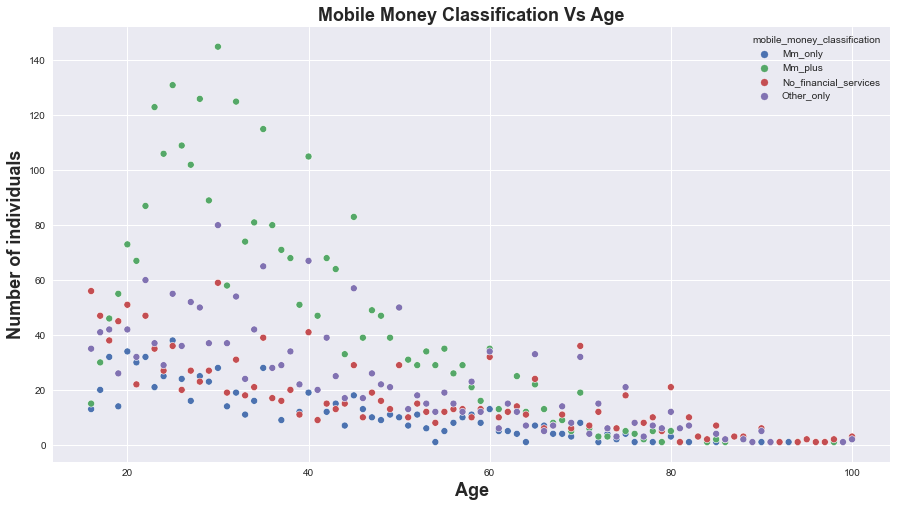

In [12]:
scatterplot_graph(df1, 'Age', 'count', 'mobile_money_classification')
title('Mobile Money Classification Vs Age')
xlabel('Age')
ylabel('Number of individuals')
fig = plt.gcf()
fig.set_size_inches(15,8)

It is evident from the graph that a large number of individuals between the age of 20-40 use Mobile money plus than any other age group, while the number of individuals decreases with increasing age.

### Mobile money classification vs Gender

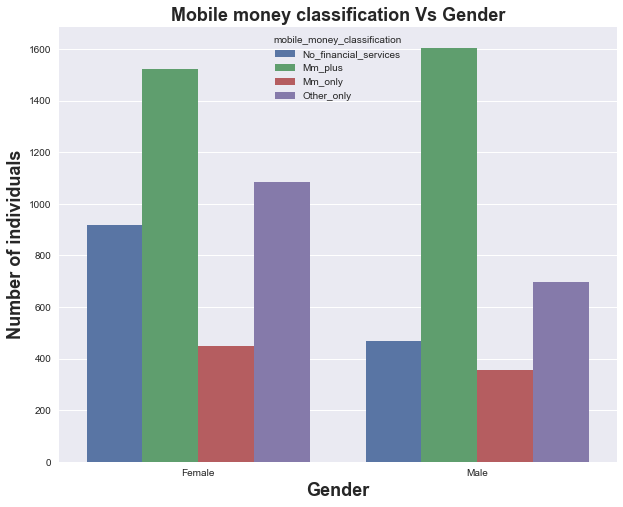

In [13]:
countplot_graph(gender, exclusive_categories)
xlabel('Gender')
ylabel('Number of individuals')
title('Mobile money classification Vs Gender')
fig = plt.gcf()
fig.set_size_inches(10,8)

Number of individuals using Mobile money plus is higher in Males than it is in Females

### Mobile money classification vs Marital status

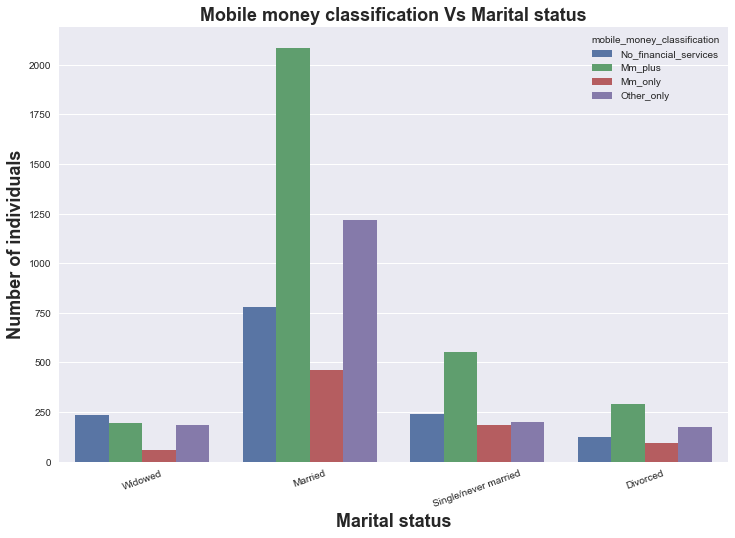

In [14]:
countplot_graph(marital_status, exclusive_categories)
xlabel('Marital status')
ylabel('Number of individuals')
title('Mobile money classification Vs Marital status')
plt.xticks(rotation = 20)
fig = plt.gcf()
fig.set_size_inches(12,8)

The number of individuals using Mobile money plus and Other_only is much higher in married individuals than in any other marital status

### Mobile money classification vs Land ownership

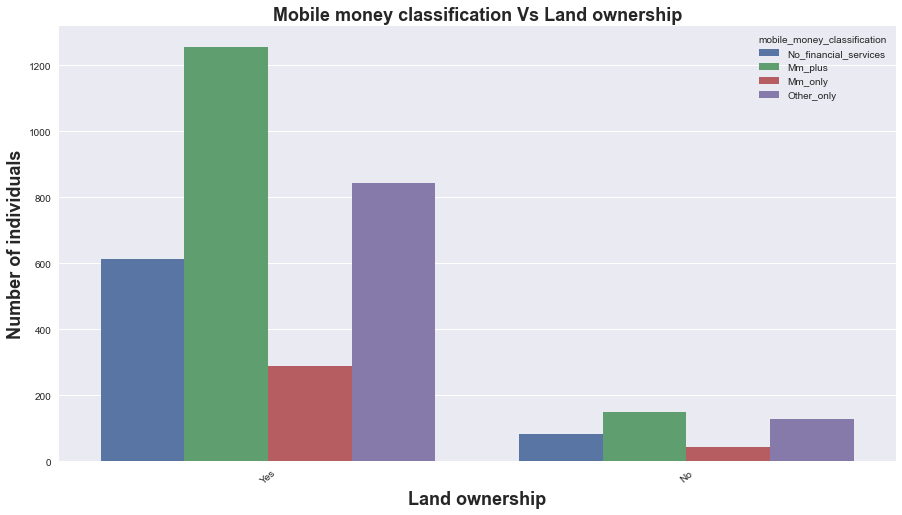

In [15]:
countplot_graph(land_ownership, exclusive_categories)
xlabel('Land ownership')
ylabel('Number of individuals')
title('Mobile money classification Vs Land ownership')
plt.xticks(rotation = 40)
fig = plt.gcf()
fig.set_size_inches(15,8)

The highest number of individuals using Mobile money plus are individuals that own land while the second to lowest number
of individuals using Mobile money plus are individuals that do not own land. Moreover there is a small number of individuals who do not own land.

It is also evident from the graph that the number of Mobile money plus users is higher in both land owners and those who do not own land. 

### Mobile money classification vs Type of income

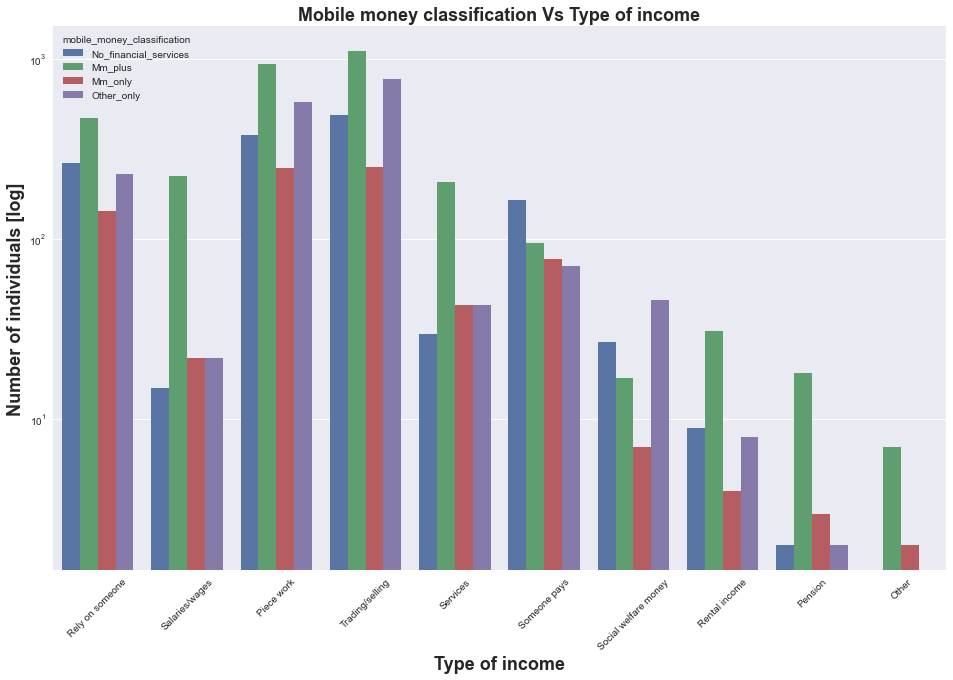

In [16]:
countplot_graph(df_new['type of income'], exclusive_categories)
xlabel('Type of income')
ylabel('Number of individuals [log]')
title('Mobile money classification Vs Type of income')
plt.xticks(rotation = 45)
plt.yscale("log")
fig = plt.gcf()
fig.set_size_inches(16,10)

The highest number of individuals in Mobile money plus and Other_only is in individuals who are trading/selling, followed by individuals who do piece work.

## Mobile money usage (purchases/paying bills) vs Age 

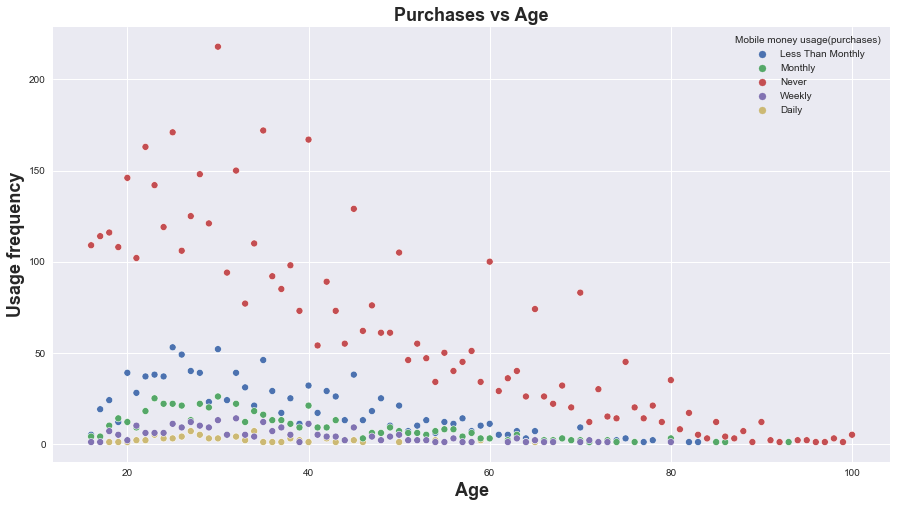

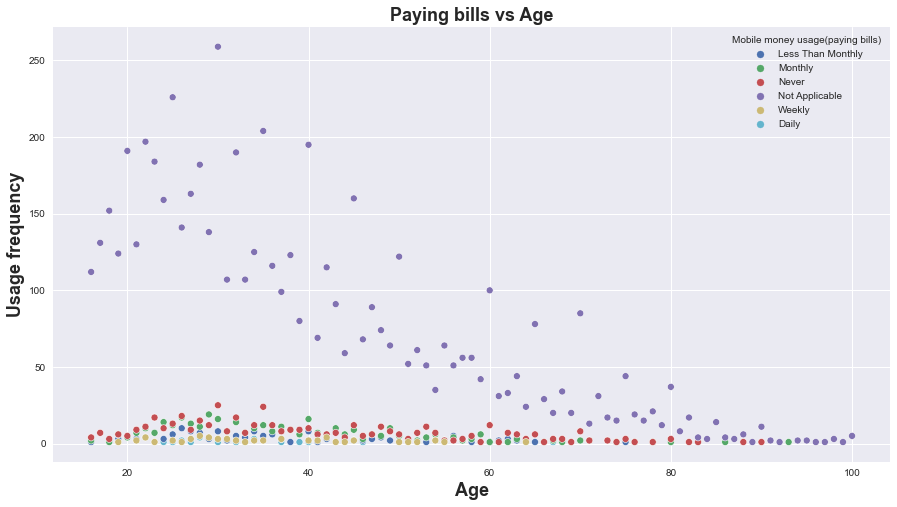

In [17]:
df1 = df_new.replace({'Mobile money usage(purchases)':usage_frequency})
df1 = df1.groupby(['Age', 'Mobile money usage(purchases)']).sum()

scatterplot_graph(df1, 'Age', 'count', 'Mobile money usage(purchases)')
title('Purchases vs Age')
xlabel('Age')
ylabel('Usage frequency')
fig = plt.gcf()
fig.set_size_inches(15,8)
plt.show()

df1 = df_new.replace({'Mobile money usage(paying bills)':usage_frequency})
df1 = df1.groupby(['Age', 'Mobile money usage(paying bills)']).sum()

scatterplot_graph(df1, 'Age',  'count', 'Mobile money usage(paying bills)')
title('Paying bills vs Age')
xlabel('Age')
ylabel('Usage frequency')
fig = plt.gcf()
fig.set_size_inches(15,8)
plt.show()

Looking at the "Purchases vs Age" graph we can see that the usage frequency is much higher on Never category than in all age groups.

Looking at the "Paying bills vs Age" graph we can tell the similaries in both graphs, the usage frequency is much higher on Not Applicable category in all age groups.

## Mobile money usage (purchases/paying bills) vs Gender 

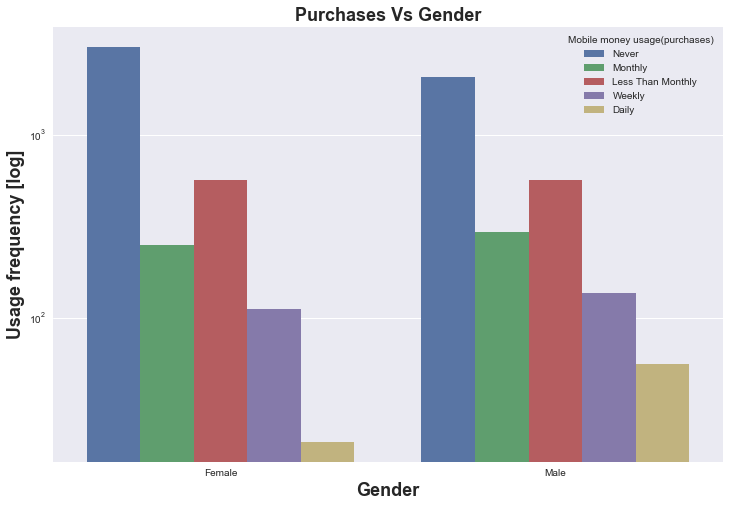

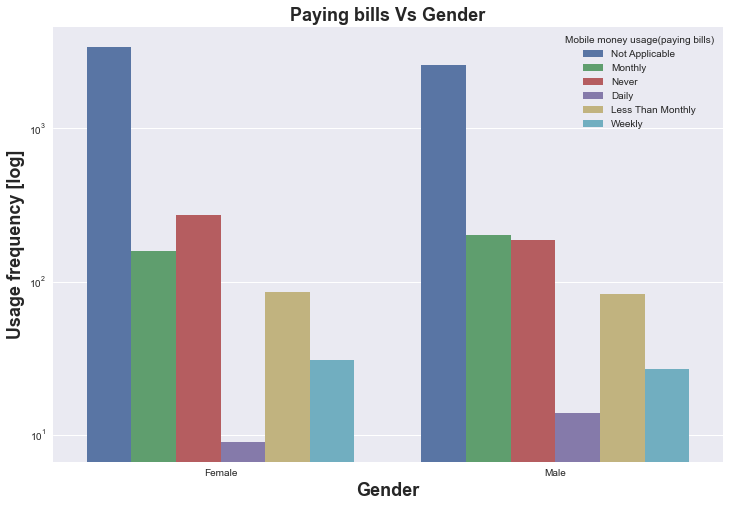

In [18]:
countplot_graph(gender, mobile_money_purchases)
xlabel('Gender')
ylabel('Usage frequency [log]')
title('Purchases Vs Gender')
plt.yscale("log")
fig = plt.gcf()
fig.set_size_inches(12,8)
plt.show()

countplot_graph(gender, mobile_money_bills)
xlabel('Gender')
ylabel('Usage frequency [log]')
title('Paying bills Vs Gender')
plt.yscale("log")
fig = plt.gcf()
fig.set_size_inches(12,8)
plt.show()

It is evident from both graphs that the Usage frequency is much higher in Females on the "Never" and "Not applicable" categories respectively. 

## Mobile money usage (purchases/paying bills) vs Marital status

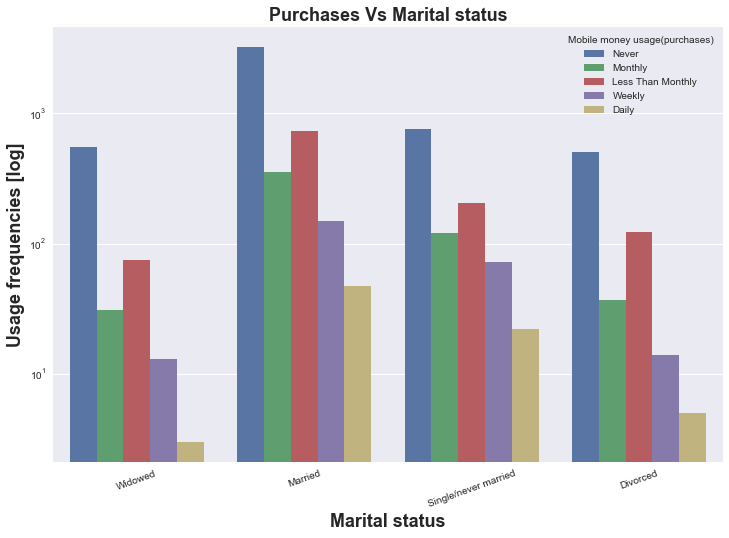

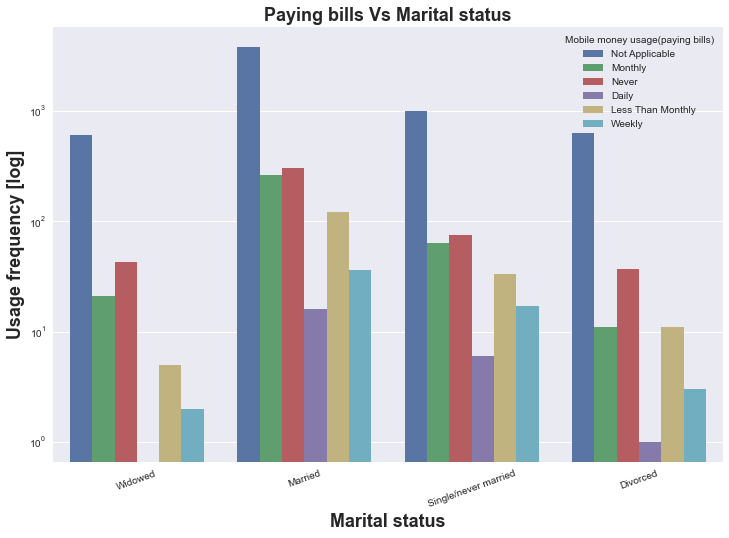

In [19]:
countplot_graph(marital_status, mobile_money_purchases)
xlabel('Marital status')
ylabel('Usage frequencies [log]')
title('Purchases Vs Marital status')
plt.xticks(rotation = 20)
plt.yscale("log")
fig = plt.gcf()
fig.set_size_inches(12,8)
plt.show()

countplot_graph(marital_status, mobile_money_bills)
xlabel('Marital status')
ylabel('Usage frequency [log]')
title('Paying bills Vs Marital status')
plt.xticks(rotation = 20)
plt.yscale("log")
fig = plt.gcf()
fig.set_size_inches(12,8)
plt.show()

It is quite evident from the first graph that Married people never use Mobile money for purchases while on the second graph it shows that Married people fall under the "Not applicable" when it comes to Mobile money usage for paying bills. 

## Mobile money usage (purchases/paying bills) vs Land ownership

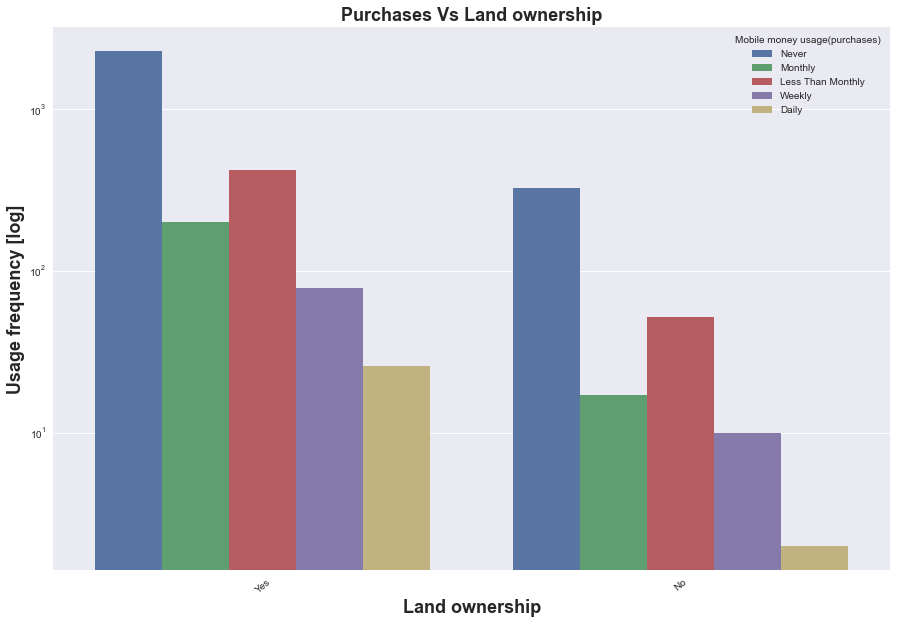

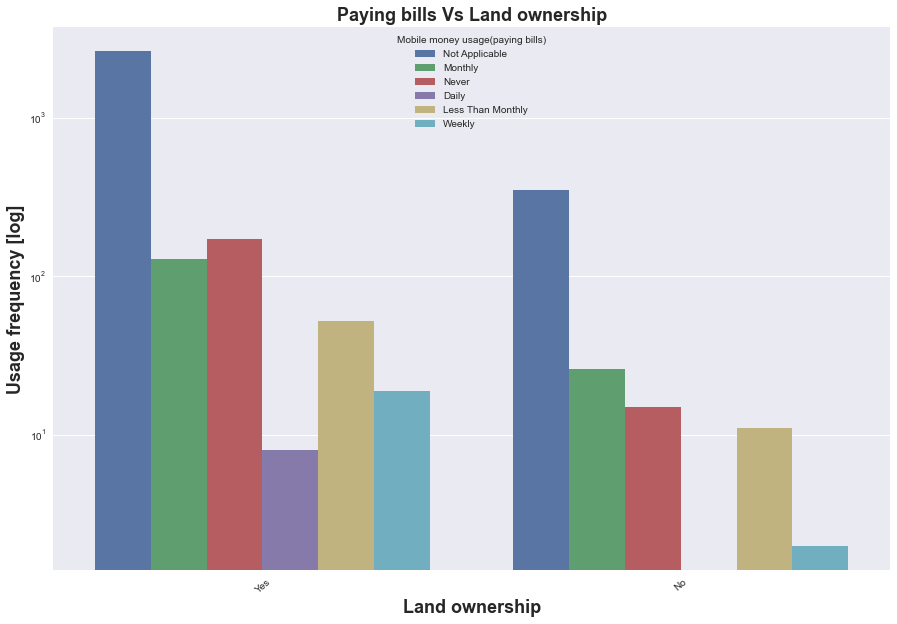

In [20]:
countplot_graph(land_ownership, mobile_money_purchases)
xlabel('Land ownership')
ylabel('Usage frequency [log]')
title('Purchases Vs Land ownership')
plt.xticks(rotation = 40)
plt.yscale("log")
fig = plt.gcf()
fig.set_size_inches(15,10)
plt.show()

countplot_graph(land_ownership, mobile_money_bills)
xlabel('Land ownership')
ylabel('Usage frequency [log]')
title('Paying bills Vs Land ownership')
plt.xticks(rotation = 40)
plt.yscale("log")
fig = plt.gcf()
fig.set_size_inches(15,10)
plt.show()

A large number of individuals who Own land never use mobile money for purchases while also a slightly high number of individuals use mobile money for purchase less than monthly. 

The same applies to the second graph, a large number of individuals who Own land fall under "Not applicable", in mobile money usage for paying bills.

## Mobile money usage (purchases/paying bills) vs Type of income

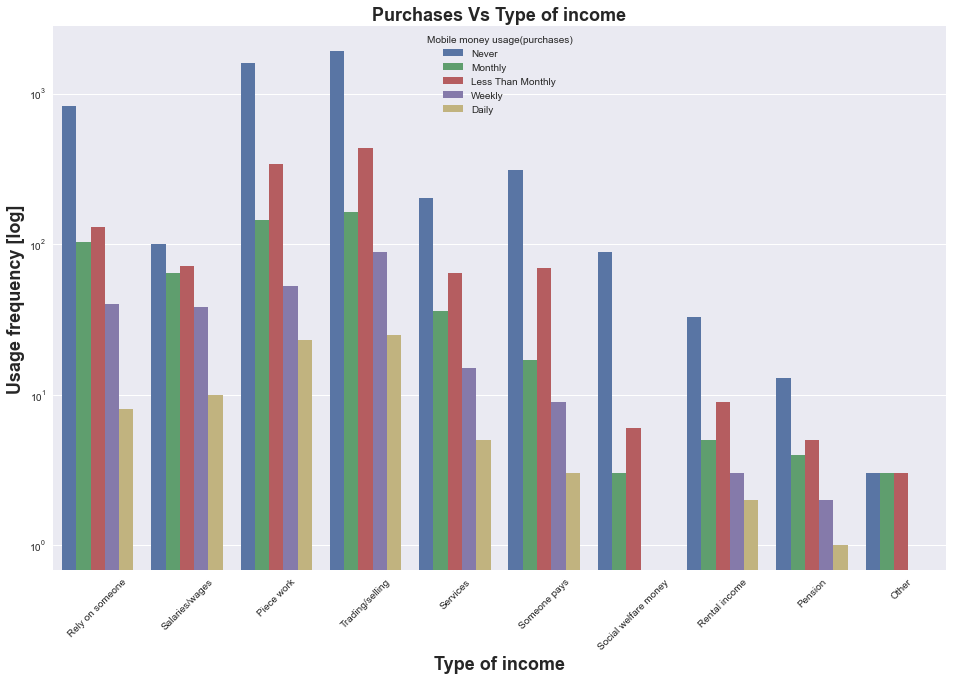

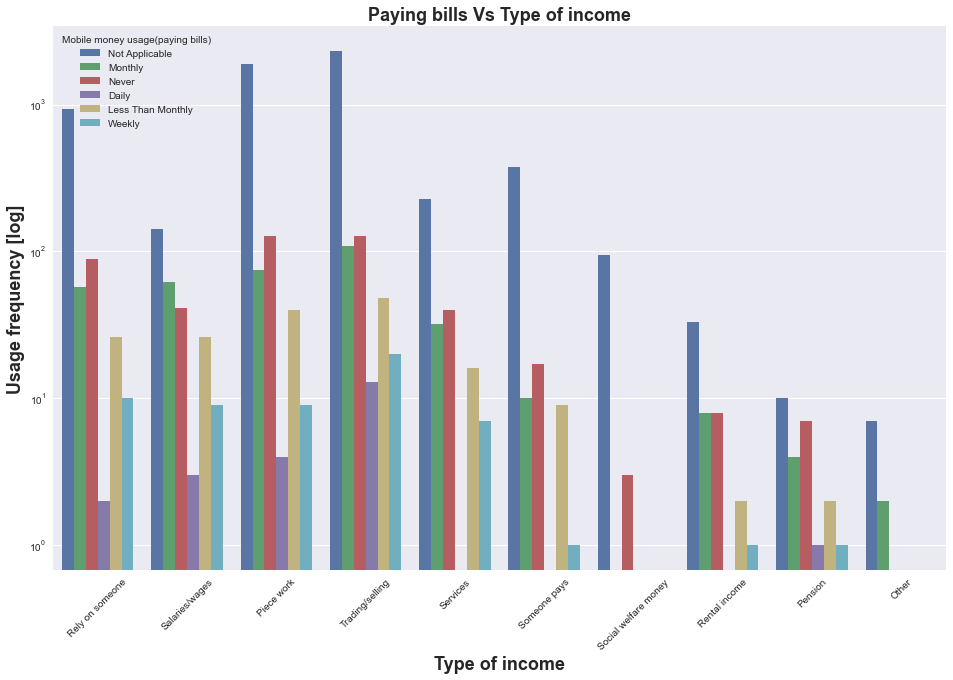

In [21]:
countplot_graph(df_new['type of income'], mobile_money_purchases)
xlabel('Type of income')
ylabel('Usage frequency [log]')
title('Purchases Vs Type of income')
plt.xticks(rotation = 45)
plt.yscale("log")
fig = plt.gcf()
fig.set_size_inches(16,10)
plt.show()

countplot_graph(df_new['type of income'], mobile_money_bills)
xlabel('Type of income')
ylabel('Usage frequency [log]')
title('Paying bills Vs Type of income')
plt.xticks(rotation = 45)
plt.yscale("log")
fig = plt.gcf()
fig.set_size_inches(16,10)
plt.show()

Observing the first graph, individuals who are trading/selling never use mobile money for purchases, followed by individuals who do piece work, while on the second graph it is evident that individuals trading/selling have the highest usage frequency in "Not Applicable", followed by individuals who do piece work.

#### Creating a map to visually explore geographic distribution of mobile services coverage with respect to type of income.

In [22]:
geometry = gp.points_from_xy(df_new.Longitude, df_new.Latitude)
geo_df = gp.GeoDataFrame(df_new[['Latitude', 'Longitude', 'type of income']], geometry=geometry)
geo_df.head()

,Latitude,Longitude,type of income,geometry
0,-4.460442,29.811396,Rely on someone,POINT (29.81140 -4.46044)
1,-6.176438,39.244871,Salaries/wages,POINT (39.24487 -6.17644)
2,-6.825702,37.652798,Rely on someone,POINT (37.65280 -6.82570)
3,-3.372049,35.808307,Piece work,POINT (35.80831 -3.37205)
4,-7.179645,31.039095,Trading/selling,POINT (31.03910 -7.17965)


In [23]:
world = gp.read_file(gp.datasets.get_path('naturalearth_lowres'))
tanzania = world[world.name == 'Tanzania']

<module 'matplotlib.pyplot' from 'C:\\Users\\27789\\anaconda3\\envs\\geo_env\\lib\\site-packages\\matplotlib\\pyplot.py'>

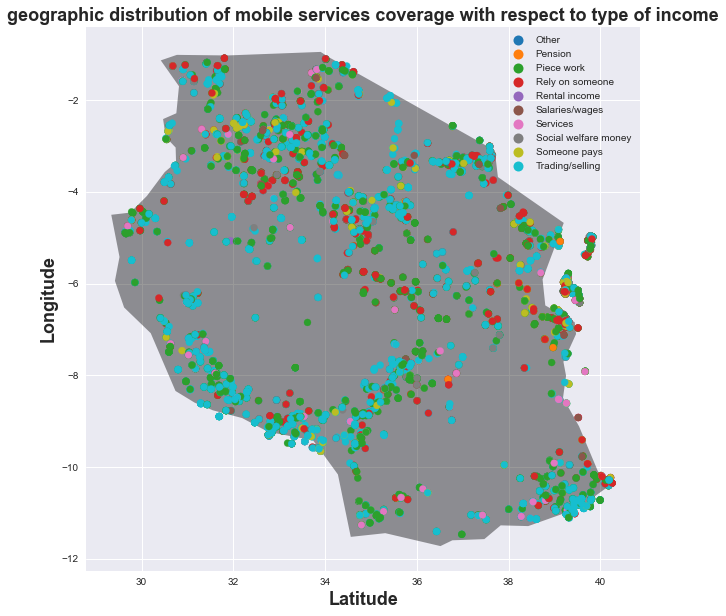

In [24]:
fig, ax = plt.subplots(figsize=(10,10), alpha=0.5, edgecolor='k')
tanzania.plot(ax=ax, alpha=0.4, cmap='gray')
geo_df.plot(column='type of income', ax=ax, legend=True)
title('geographic distribution of mobile services coverage with respect to type of income')
xlabel('Latitude')
ylabel('Longitude')

By looking at the geographic distribution, it is quite evident that in Tanzania there is a lot of people who are trading/selling, followed by people who do piece work, and people who rely on someone. 

Also looking at the Map below, there is a large number of people trading around Dar es-Salaam area followed by people trading between Mwanza and Shinyanga area.

To see a type of income on each individual marker, zoom in and click on the marker to view the type of income popup on the map below.

### Below is a reference Map(interactive) to the above plots

In [28]:
def icon(color):
    point = folium.Marker(
           location=[df_new.iloc[row]['Latitude'], df_new.iloc[row]['Longitude']],
           popup=df_new.iloc[row]['type of income'], icon=color).add_to(marker_cluster)
    return point

In [37]:
maps = folium.Map(location=[-6.161184, 35.745426], tiles='OpenStreetMap', zoom_start=6)
marker_cluster = MarkerCluster().add_to(maps)

for row in range(0,len(df_new)):
    if df_new.iloc[row]['type of income'] == 'Salaries/wages':
        icon(folium.Icon(color='darkgreen'))
    elif df_new.iloc[row]['type of income'] == 'Trading/selling':
        icon(folium.Icon(color='darkred'))
    elif df_new.iloc[row]['type of income'] == 'Services':
        icon(folium.Icon(color='purple'))
    elif df_new.iloc[row]['type of income'] == 'Piece work':
        icon(folium.Icon(color='black'))
    elif df_new.iloc[row]['type of income'] == 'Rental income':
        icon(folium.Icon(color='pink'))
    elif df_new.iloc[row]['type of income'] == 'Pension':
        icon(folium.Icon(color='orange'))
    elif df_new.iloc[row]['type of income'] == 'Social welfare money':
        icon(folium.Icon(color='lightgreen'))
    elif df_new.iloc[row]['type of income'] == 'Rely on someone':
        icon(folium.Icon(color='cadetblue'))
    elif df_new.iloc[row]['type of income'] == 'Someone pays':
        icon(folium.Icon(color='blue'))
    elif df_new.iloc[row]['type of income'] == 'Other':
        icon(folium.Icon(color='white'))

    
template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
<meta charset="utf-8">
<meta name="viewport" content="width=device-width, initial-scale=1">
<title>jQuery UI Draggable - Default functionality</title>
<link rel="stylesheet" href="code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

<script src="https://code.jquery.com/jquery-1.12.4.js"></script>
<script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>

<script>
$( function() {
$( "#maplegend" ).draggable({
start: function (event, ui) {
$(this).css({
right: "auto",
top: "auto",
bottom: "auto"
});
}
});
});

</script>
</head>
<body>


<div id='maplegend' class='maplegend'
style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>

<div class='legend-title'>Legend (draggable!) <br> <br>Type of income</div>

<div class='legend-scale'>
<ul class='legend-labels'>
<li><span style='background:darkgreen;opacity:0.7;'></span>Salaries/wages</li>
<li><span style='background:darkred;opacity:0.7;'></span>Trading/selling</li>
<li><span style='background:purple;opacity:0.7;'></span>Services</li>
<li><span style='background:black;opacity:0.7;'></span>Piece work</li>
<li><span style='background:pink;opacity:0.7;'></span>Rental income</li>
<li><span style='background:orange;opacity:0.7;'></span>Pension</li>
<li><span style='background:lightgreen;opacity:0.7;'></span>Social welfare money</li>
<li><span style='background:cadetblue;opacity:0.7;'></span>Rely on someone</li>
<li><span style='background:blue;opacity:0.7;'></span>Someone pays</li>
<li><span style='background:white;opacity:0.7;'></span>Other</li>


</ul>
</div>
</div>

</body>
</html>

<style type='text/css'>
.maplegend .legend-title {
text-align: left;
margin-bottom: 5px;
font-weight: bold;
font-size: 90%;
}
.maplegend .legend-scale ul {
margin: 0;
margin-bottom: 5px;
padding: 0;
float: left;
list-style: none;
}
.maplegend .legend-scale ul li {
font-size: 80%;
list-style: none;
margin-left: 0;
line-height: 18px;
margin-bottom: 2px;
}
.maplegend ul.legend-labels li span {
display: block;
float: left;
height: 16px;
width: 30px;
margin-right: 5px;
margin-left: 0;
border: 1px solid #999;
}
.maplegend .legend-source {
font-size: 80%;
color: #777;
clear: both;
}
.maplegend a {
color: #777;
}
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

maps.get_root().add_child(macro)
maps

### Conclusion about the use of financial services in Tanzania

Through out this data analysis, we were able to see that the demographics used in this analysis are able to help us tell what is from what is not. It is quite clear that most income comes from Trading/selling and it seems most trading/selling takes place in almost all parts of Tanzania. Looking at the mobile money services, we have seen that these services are mostly used by people who are in their 20s. 

The number of Males using mobile money plus(Mm_plus) is more than that of woman. We have also seen that most Males are likely to use mobile money for purchases and paying bills than Females.

In comparison to other marital statuses, a huge number of Married people use mobile money plus(Mm_plus) and one other financial service. The land owners are most likely to use mobile money for purchases and paying bills than any other land ownership category.